# Berlin Postal Codes and Districts

## Installations

In [6]:
# !pip3 install --upgrade pip

In [7]:
# %pip install geopandas
# %pip install tabulate
# pip install contextily

## Imports

In [8]:
import sys

from tabulate import tabulate
import numpy as np
import pandas as pd

import geopandas

from shapely.geometry import Point

import folium

import matplotlib.pyplot as plt
%matplotlib inline

import contextily as cx

## Display Imports & Their Versions

In [9]:
headers = ["Software/Library", "Version"]

table_data = [
    ['Python', sys.version[0:6]],
    ['NumPy', np.__version__],
    ['Pandas', pd.__version__],
    ['geopandas', geopandas.__version__],
    ['Contextily', cx.__version__]
    ]

print(tabulate(table_data, headers=headers, tablefmt="grid"))

+--------------------+-----------+
| Software/Library   | Version   |
+====================+===========+
| Python             | 3.11.4    |
+--------------------+-----------+
| NumPy              | 1.26.4    |
+--------------------+-----------+
| Pandas             | 1.5.3     |
+--------------------+-----------+
| geopandas          | 1.0.1     |
+--------------------+-----------+
| Contextily         | 1.6.2     |
+--------------------+-----------+


## Import Dataset (Berlin Data)

In [10]:
gdf_berlin = geopandas.read_file("data/berlin_plz.geojson")

gdf_berlin

,plz,geometry
0,10115,"POLYGON ((13.36586 52.53566, 13.36829 52.53329..."
1,10117,"POLYGON ((13.37374 52.5278, 13.37382 52.5277, ..."
2,10119,"POLYGON ((13.39902 52.52701, 13.40134 52.52631..."
3,10178,"POLYGON ((13.39902 52.52701, 13.39877 52.52679..."
4,10179,"POLYGON ((13.40305 52.51217, 13.40261 52.51186..."
...,...,...
189,12439,"POLYGON ((13.5024 52.46387, 13.50209 52.46428,..."
190,14055,"POLYGON ((13.25075 52.51258, 13.25059 52.51259..."
191,15537,"POLYGON ((13.68682 52.3853, 13.68734 52.38522,..."
192,15566,"POLYGON ((13.70525 52.45987, 13.7053 52.45964,..."


## Import Dataset (lor bezirks Data)

In [11]:
gdf_lb = geopandas.read_file("data/lor_bezirksregionen.geojson")

gdf_lb

,BEZIRKSNAM,BEZIRKSREG,DATUM_GUEL,FLAECHENGR,broker Dow,geometry
0,Mitte,Tiergarten Süd,26.10.2007,5.171462e+06,010111,"MULTIPOLYGON (((389319.545 5817775.779, 389307..."
1,Mitte,Regierungsviertel,26.10.2007,2.691032e+06,010112,"MULTIPOLYGON (((389869.331 5820074.335, 389882..."
2,Mitte,Alexanderplatz,26.10.2007,6.228903e+06,010113,"MULTIPOLYGON (((391669.886 5818749.585, 391681..."
3,Mitte,Brunnenstraße Süd,26.10.2007,1.753345e+06,010114,"MULTIPOLYGON (((391729.067 5822322.363, 391774..."
4,Mitte,Moabit West,26.10.2007,4.329256e+06,010221,"MULTIPOLYGON (((387739.367 5822280.605, 387766..."
...,...,...,...,...,...,...
133,Reinickendorf,Nord 1 - Frohnau/Hermsdorf,29.08.2014,1.389089e+07,122311,"MULTIPOLYGON (((386772.807 5830603.015, 386761..."
134,Reinickendorf,Nord 2 - Waidmannslust/Wittenau/Lübars,29.08.2014,1.179220e+07,123012,"MULTIPOLYGON (((389342.348 5831852.566, 389346..."
135,Reinickendorf,MV 1 - Märkisches Viertel,29.08.2014,3.146634e+06,123021,"MULTIPOLYGON (((388055.161 5827959.366, 388044..."
136,Reinickendorf,MV 2 - Rollbergesiedlung,29.08.2014,1.634640e+06,123022,"MULTIPOLYGON (((387315.828 5828669.597, 387288..."


### Retrieve Descriptive Statistics About LB Dataset

In [12]:
gdf_lb.describe(include='all')

,BEZIRKSNAM,BEZIRKSREG,DATUM_GUEL,FLAECHENGR,broker Dow,geometry
count,138,138,138,1.380000e+02,138,138
unique,12,138,3,NaN,138,138
top,Treptow-Köpenick,Tiergarten Süd,26.10.2007,NaN,010111,MULTIPOLYGON (((389319.54543922737 5817775.778...
freq,20,1,125,NaN,1,1
mean,NaN,NaN,NaN,6.454448e+06,NaN,NaN
std,NaN,NaN,NaN,6.241957e+06,NaN,NaN
min,NaN,NaN,NaN,7.134580e+05,NaN,NaN
25%,NaN,NaN,NaN,2.345033e+06,NaN,NaN
50%,NaN,NaN,NaN,4.278922e+06,NaN,NaN
75%,NaN,NaN,NaN,7.938368e+06,NaN,NaN


### Retrieve Descriptive Statistics About Berlin Dataset

In [13]:
gdf_berlin.describe(include='all')

,plz,geometry
count,194,194
unique,193,193
top,14193,POLYGON ((13.199073637874555 52.49987783254237...
freq,2,2


### Rename Columns in gdf_berlin

In [14]:
gdf_berlin = gdf_berlin.rename(
    columns={
        "plz": "Zip Code"
    }
)

gdf_berlin.head()

,Zip Code,geometry
0,10115,"POLYGON ((13.36586 52.53566, 13.36829 52.53329..."
1,10117,"POLYGON ((13.37374 52.5278, 13.37382 52.5277, ..."
2,10119,"POLYGON ((13.39902 52.52701, 13.40134 52.52631..."
3,10178,"POLYGON ((13.39902 52.52701, 13.39877 52.52679..."
4,10179,"POLYGON ((13.40305 52.51217, 13.40261 52.51186..."


### Rename Columns in gdf_lb

In [15]:
gdf_lb = gdf_lb.rename(
    columns={
        "BEZIRKSNAM": "District Office",
        "BEZIRKSREG": "government district",
        "DATUM_GUEL": "Date",
        "FLAECHENGR": "Area/Size"
    }
    )

gdf_lb.head()

,District Office,government district,Date,Area/Size,broker Dow,geometry
0,Mitte,Tiergarten Süd,26.10.2007,5.171462e+06,010111,"MULTIPOLYGON (((389319.545 5817775.779, 389307..."
1,Mitte,Regierungsviertel,26.10.2007,2.691032e+06,010112,"MULTIPOLYGON (((389869.331 5820074.335, 389882..."
2,Mitte,Alexanderplatz,26.10.2007,6.228903e+06,010113,"MULTIPOLYGON (((391669.886 5818749.585, 391681..."
3,Mitte,Brunnenstraße Süd,26.10.2007,1.753345e+06,010114,"MULTIPOLYGON (((391729.067 5822322.363, 391774..."
4,Mitte,Moabit West,26.10.2007,4.329256e+06,010221,"MULTIPOLYGON (((387739.367 5822280.605, 387766..."


### Non-Interactive Data Visualization for Berlin Dataset

In [16]:
gdf_berlin.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 194 entries, 0 to 193
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   Zip Code  194 non-null    object  
 1   geometry  194 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 3.2+ KB


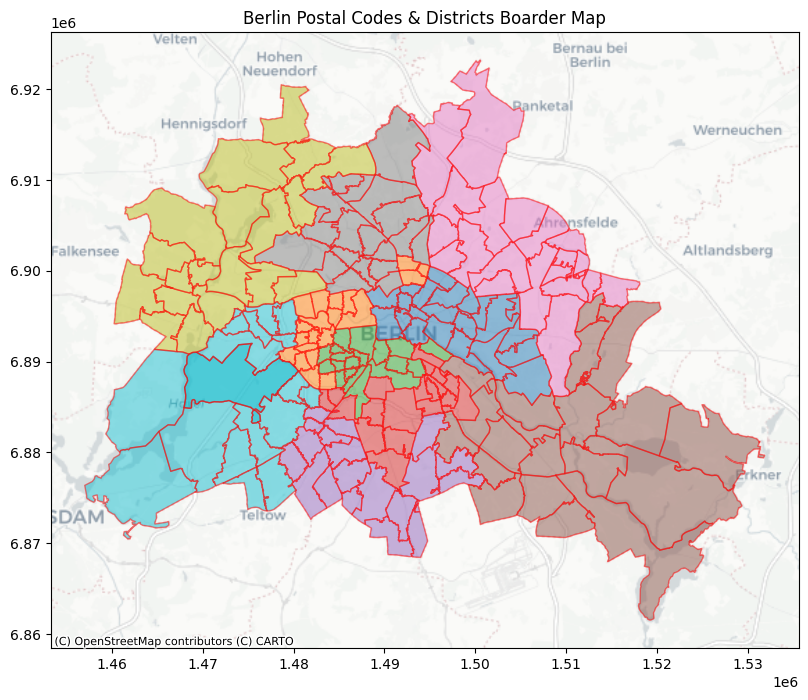

In [17]:
gdf_plot = gdf_berlin.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(24, 8))
gdf_plot.plot(column='Zip Code', ax=ax, alpha=0.5, edgecolor="red")

cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

ax.set_title("Berlin Postal Codes & Districts Boarder Map")

plt.show()

### Non-Interactive Data Visualization for LB Dataset

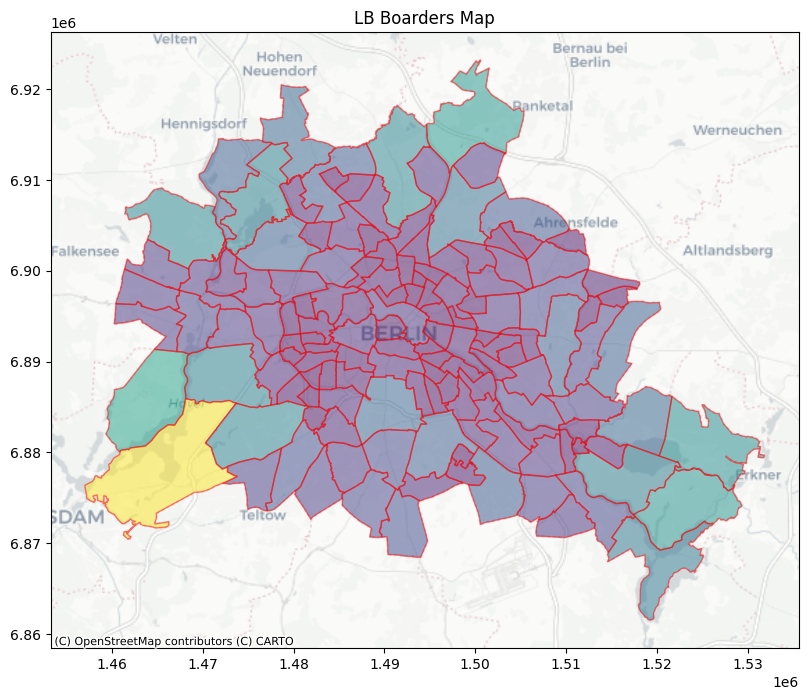

In [18]:
gdf_plot = gdf_lb.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(24, 8))
gdf_plot.plot(column='Area/Size', ax=ax, alpha=0.5, edgecolor="red")


cx.add_basemap(ax, source=cx.providers.CartoDB.Positron)

ax.set_title("LB Boarders Map")

plt.show()

### Interactive Data Visualization for Berlin Dataset

In [26]:
gdf_berlin

,Zip Code,geometry
0,10115,"POLYGON ((13.36586 52.53566, 13.36829 52.53329..."
1,10117,"POLYGON ((13.37374 52.5278, 13.37382 52.5277, ..."
2,10119,"POLYGON ((13.39902 52.52701, 13.40134 52.52631..."
3,10178,"POLYGON ((13.39902 52.52701, 13.39877 52.52679..."
4,10179,"POLYGON ((13.40305 52.51217, 13.40261 52.51186..."
...,...,...
189,12439,"POLYGON ((13.5024 52.46387, 13.50209 52.46428,..."
190,14055,"POLYGON ((13.25075 52.51258, 13.25059 52.51259..."
191,15537,"POLYGON ((13.68682 52.3853, 13.68734 52.38522,..."
192,15566,"POLYGON ((13.70525 52.45987, 13.7053 52.45964,..."


In [27]:
gdf_berlin.explore(
    m = folium.Map(
        location=[52.5, 13.45],
        tiles='OpenStreetMap',
        zoom_start=10,
        prefer_canvas=True
        ),
    popup=True,
    highlight=True,
    legend=True,
    control_scale=True,
    style_kwds = {
        'stroke': True,
        'color': '#3271a5',
        'weight': 1,
        'opacity': 0.75,
        'fill': True,
        'fillColor': '#b8e2f4',
        'fillOpacity': 0.35
    },
    highlight_kwds ={
        'stroke': True,
        'color': 'green',
        'weight': 2,
        'opacity': 1,
        'fill': True,
        'fillColor': '#88e788',
        'fillOpacity': 0.35
    },
    tooltip_kwds = {
        'labels': True,
        'aliases': ['Zipcode']
    }
)

### Interactive Data Visualization for LB Dataset

In [29]:
gdf_lb.explore(
    m = folium.Map(
        location=[52.5, 13.45],
        tiles='OpenStreetMap', # CartoDB Voyager, OpenStreetMap
        zoom_start=10,
        prefer_canvas=True
        ),
    popup=True,
    highlight=True,
    legend=True,
    control_scale=True,
    style_kwds = {
        'stroke': True,
        'color': '#3271a5',
        'weight': 1,
        'opacity': 0.75,
        'fill': True,
        'fillColor': '#b8e2f4',
        'fillOpacity': 0.35
    },
    highlight_kwds ={
        'stroke': True,
        'color': 'green',
        'weight': 2,
        'opacity': 1,
        'fill': True,
        'fillColor': '#88e788',
        'fillOpacity': 0.35
    },
    tooltip_kwds = {
        'labels': True,
        'aliases': ['District Office', 'Government District', 'Date', 'Area/Size', 'Broker Dow']
    }
)

## Methods & Attributes (for Berlin Dataset)

### Append Geometry Type Feature

In [91]:
print("Geometry Type")

gdf_berlin_gt = gdf_lb.copy()
gdf_berlin_gt['geometry_type'] = gdf_lb.geom_type

gdf_berlin_gt

Geometry Type


,District Office,government district,Date,Area/Size,broker Dow,geometry,geometry_type
0,Mitte,Tiergarten Süd,26.10.2007,5.171462e+06,010111,"MULTIPOLYGON (((389319.545 5817775.779, 389307...",MultiPolygon
1,Mitte,Regierungsviertel,26.10.2007,2.691032e+06,010112,"MULTIPOLYGON (((389869.331 5820074.335, 389882...",MultiPolygon
2,Mitte,Alexanderplatz,26.10.2007,6.228903e+06,010113,"MULTIPOLYGON (((391669.886 5818749.585, 391681...",MultiPolygon
3,Mitte,Brunnenstraße Süd,26.10.2007,1.753345e+06,010114,"MULTIPOLYGON (((391729.067 5822322.363, 391774...",MultiPolygon
4,Mitte,Moabit West,26.10.2007,4.329256e+06,010221,"MULTIPOLYGON (((387739.367 5822280.605, 387766...",MultiPolygon
...,...,...,...,...,...,...,...
133,Reinickendorf,Nord 1 - Frohnau/Hermsdorf,29.08.2014,1.389089e+07,122311,"MULTIPOLYGON (((386772.807 5830603.015, 386761...",MultiPolygon
134,Reinickendorf,Nord 2 - Waidmannslust/Wittenau/Lübars,29.08.2014,1.179220e+07,123012,"MULTIPOLYGON (((389342.348 5831852.566, 389346...",MultiPolygon
135,Reinickendorf,MV 1 - Märkisches Viertel,29.08.2014,3.146634e+06,123021,"MULTIPOLYGON (((388055.161 5827959.366, 388044...",MultiPolygon
136,Reinickendorf,MV 2 - Rollbergesiedlung,29.08.2014,1.634640e+06,123022,"MULTIPOLYGON (((387315.828 5828669.597, 387288...",MultiPolygon


### Add Distance Features to Dataset

In [92]:
# Use the Harvard address coordinates as the reference point for distances

latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)

if gdf_berlin.crs is None:
    gdf_berlin.set_crs(epsg=4326, inplace=True)

# Estimate an appropriate UTM CRS for your GeoDataFrame
utm_crs = gdf_berlin.estimate_utm_crs()

# Reproject your GeoDataFrame to the estimated UTM CRS
gdf_berlin_projected = gdf_berlin.to_crs(utm_crs)

# Reproject the reference point to the same UTM CRS
ref_point_projected = geopandas.GeoSeries([ref_point], crs='EPSG:4326').to_crs(utm_crs).iloc[0]

In [93]:
# Calculate distances
gdf_berlin_projected['dist_from_harvard'] = gdf_berlin_projected['geometry'].distance(ref_point_projected)
gdf_berlin_projected['frechet_dist_from_harvard'] = gdf_berlin_projected['geometry'].frechet_distance(ref_point_projected)
gdf_berlin_projected['hausdorff_dist_from_harvard'] = gdf_berlin_projected['geometry'].hausdorff_distance(ref_point_projected)

gdf_berlin_projected

,Zip Code,geometry,dist_from_harvard,frechet_dist_from_harvard,hausdorff_dist_from_harvard
0,10115,"POLYGON ((389163.21 5821872.935, 389321.827 58...",6.976581e+06,6.979292e+06,6.979292e+06
1,10117,"POLYGON ((389678.019 5820987.307, 389683.298 5...",6.977402e+06,6.980447e+06,6.980447e+06
2,10119,"POLYGON ((391390.987 5820861.12, 391546.214 58...",6.978474e+06,6.979983e+06,6.979983e+06
3,10178,"POLYGON ((391390.987 5820861.12, 391373.531 58...",6.978929e+06,6.981141e+06,6.981141e+06
4,10179,"POLYGON ((391627.933 5819203.75, 391597.101 58...",6.979502e+06,6.981865e+06,6.981865e+06
...,...,...,...,...,...
189,12439,"POLYGON ((398258.04 5813688.225, 398237.901 58...",6.988271e+06,6.992707e+06,6.992707e+06
190,14055,"POLYGON ((381294.435 5819489.719, 381283.551 5...",6.968887e+06,6.973903e+06,6.973903e+06
191,15537,"POLYGON ((410627.681 5804705.34, 410662.783 58...",7.003857e+06,7.003937e+06,7.003937e+06
192,15566,"POLYGON ((412030.385 5812976.367, 412033.404 5...",7.000684e+06,7.000703e+06,7.000703e+06


### Retrieve Coordinates

In [94]:
gdf_get_coords = gdf_berlin.get_coordinates(include_z=True)
gdf_count_coords = gdf_berlin.count_coordinates()
gdf_count_geos = gdf_berlin.count_geometries()

print(f"GDF Coordinates:\n{gdf_get_coords}\n")
print(f"GDF Count Coordinates:\n{gdf_count_coords}\n")
print(f"GDF Count Geometries:\n{gdf_count_geos}")

GDF Coordinates:
             x          y   z
0    13.365860  52.535657 NaN
0    13.368286  52.533294 NaN
0    13.368444  52.533267 NaN
0    13.368502  52.533260 NaN
0    13.368983  52.532793 NaN
..         ...        ...  ..
193  13.755701  52.445826 NaN
193  13.756125  52.445741 NaN
193  13.756423  52.446168 NaN
193  13.755923  52.446091 NaN
193  13.755914  52.446087 NaN

[57249 rows x 3 columns]

GDF Count Coordinates:
0      340
1      335
2      232
3      286
4      269
      ... 
189    278
190    357
191     37
192      4
193      6
Length: 194, dtype: int32

GDF Count Geometries:
0      1
1      1
2      1
3      1
4      1
      ..
189    1
190    1
191    1
192    1
193    1
Length: 194, dtype: int32


### Some Basic Functions

In [95]:
gdf_is_simple = gdf_berlin.is_simple
gdf_is_valid = gdf_berlin.is_valid
gdf_is_valid_reason = gdf_berlin.is_valid_reason()
gdf_has_z = gdf_berlin.has_z

gdf_is_simple_value_counts = gdf_is_simple.value_counts()
gdf_is_valid_value_counts = gdf_is_valid.value_counts()
gdf_is_valid_reason_value_counts = gdf_is_valid_reason.value_counts()
gdf_has_z_value_counts = gdf_has_z.value_counts()

print(f"is_simple:\n{gdf_is_simple_value_counts}\n")
print(f"is_valid:\n{gdf_is_valid_value_counts}\n")
print(f"is_valid_reason:\n{gdf_is_valid_reason_value_counts}\n")
print(f"has_z:\n{gdf_has_z_value_counts}\n")

is_simple:
True    194
dtype: int64

is_valid:
True    194
dtype: int64

is_valid_reason:
Valid Geometry    194
dtype: int64

has_z:
False    194
dtype: int64



### Determine If Points Fall Within Polygons

In [96]:
points_to_use = geopandas.GeoSeries([
    Point(-95.67804, 39.04833), # Topeka, Kansas, USA
    Point(-114.0719, 51.0447),  # Calgary, Alberta, Canada
    Point(80.0, -10.0),         # Midpoint in the Indian Ocean
    Point(-19.0208, 64.9631),   # Center of Iceland
    Point(86.9250, 27.9881),    # Mount Everest, Nepal
    Point(149.1300, -35.2809)   # Canberra, Australia (Capital City)
])

# Create a GeoDataFrame from points
points_to_use = geopandas.GeoDataFrame(geometry=points_to_use)

# Ensure both GeoDataFrames have the same CRS
points_to_use = points_to_use.set_crs(gdf_berlin.crs, allow_override=True)

# Perform spatial join to find points within polygons
points_within = geopandas.sjoin(points_to_use, gdf_berlin, predicate='within', how='inner')

print("points_within")
print(points_within)

points_within
Empty GeoDataFrame
Columns: [geometry, index_right, Zip Code]
Index: []


### Determine If Points Do NOT Fall Within Polygons

In [97]:
points_not_within = points_to_use[~points_to_use.index.isin(points_within.index)]

print("points_not_within")
print(points_not_within)

points_not_within
                     geometry
0  POINT (-95.67804 39.04833)
1   POINT (-114.0719 51.0447)
2              POINT (80 -10)
3    POINT (-19.0208 64.9631)
4      POINT (86.925 27.9881)
5     POINT (149.13 -35.2809)


### Determine If Areas Are Within Specified Distance's (Radii) From Defined Reference Point

In [98]:
latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)
ref_point_gs = geopandas.GeoSeries([ref_point], crs=gdf_berlin_projected.crs)

# List of distances to check
distances = [5, 10, 50, 100, 250, 500, 1000, 2500]

# Initialize a DataFrame to store results
results = gdf_berlin_projected.copy()

# Apply the dwithin function for each distance
for dist in distances:
    results[f'within_{dist}'] = gdf_berlin_projected.geometry.dwithin(ref_point_gs.geometry[0], distance=dist)

# Display the results
print(results)

    Zip Code                                           geometry  \
0      10115  POLYGON ((389163.21 5821872.935, 389321.827 58...   
1      10117  POLYGON ((389678.019 5820987.307, 389683.298 5...   
2      10119  POLYGON ((391390.987 5820861.12, 391546.214 58...   
3      10178  POLYGON ((391390.987 5820861.12, 391373.531 58...   
4      10179  POLYGON ((391627.933 5819203.75, 391597.101 58...   
..       ...                                                ...   
189    12439  POLYGON ((398258.04 5813688.225, 398237.901 58...   
190    14055  POLYGON ((381294.435 5819489.719, 381283.551 5...   
191    15537  POLYGON ((410627.681 5804705.34, 410662.783 58...   
192    15566  POLYGON ((412030.385 5812976.367, 412033.404 5...   
193    15569  POLYGON ((415446.062 5811383.014, 415431.116 5...   

     dist_from_harvard  frechet_dist_from_harvard  \
0         6.976581e+06               6.979292e+06   
1         6.977402e+06               6.980447e+06   
2         6.978474e+06              

### Some More Functions

In [99]:
gdf_berlin.boundary

0      LINESTRING (13.36586 52.53566, 13.36829 52.533...
1      LINESTRING (13.37374 52.5278, 13.37382 52.5277...
2      LINESTRING (13.39902 52.52701, 13.40134 52.526...
3      LINESTRING (13.39902 52.52701, 13.39877 52.526...
4      LINESTRING (13.40305 52.51217, 13.40261 52.511...
                             ...                        
189    LINESTRING (13.5024 52.46387, 13.50209 52.4642...
190    LINESTRING (13.25075 52.51258, 13.25059 52.512...
191    LINESTRING (13.68682 52.3853, 13.68734 52.3852...
192    LINESTRING (13.70525 52.45987, 13.7053 52.4596...
193    LINESTRING (13.75591 52.44609, 13.7557 52.4458...
Length: 194, dtype: geometry

In [100]:
gdf_berlin_projected.buffer(distance=125)

0      POLYGON ((389092.912 5821976.295, 389095.343 5...
1      POLYGON ((389405.106 5820523.62, 389405.03 582...
2      POLYGON ((391174.861 5821105.655, 391169.036 5...
3      POLYGON ((390997.528 5820262.673, 390990.813 5...
4      POLYGON ((391532.47 5818763.373, 391529.172 58...
                             ...                        
189    POLYGON ((398133.582 5813223.525, 398131.571 5...
190    POLYGON ((378100.774 5817832.831, 378090.286 5...
191    POLYGON ((410529.304 5804628.453, 410526.16 58...
192    POLYGON ((412054.757 5813098.968, 412074.779 5...
193    POLYGON ((415378.713 5811488.319, 415379.321 5...
Length: 194, dtype: geometry

In [101]:
gdf_berlin_projected.centroid

0       POINT (390426.23 5821465.735)
1      POINT (390565.621 5819761.407)
2      POINT (391826.781 5821236.957)
3      POINT (392096.472 5820211.206)
4      POINT (392529.262 5819186.939)
                    ...              
189    POINT (400015.818 5812416.577)
190    POINT (380857.198 5818317.259)
191    POINT (410667.007 5804749.802)
192    POINT (412038.065 5812966.622)
193    POINT (415455.585 5811367.987)
Length: 194, dtype: geometry

In [102]:
gdf_berlin.convex_hull

0      POLYGON ((13.40076 52.52376, 13.40066 52.52377...
1      POLYGON ((13.37893 52.50693, 13.37764 52.50797...
2      POLYGON ((13.40944 52.52425, 13.40906 52.52427...
3      POLYGON ((13.40305 52.51217, 13.40152 52.51366...
4      POLYGON ((13.41406 52.50404, 13.41335 52.50427...
                             ...                        
189    POLYGON ((13.53316 52.44225, 13.5305 52.44271,...
190    POLYGON ((13.25697 52.486, 13.21199 52.49477, ...
191    POLYGON ((13.68758 52.38518, 13.68734 52.38522...
192    POLYGON ((13.7053 52.45964, 13.70525 52.45987,...
193    POLYGON ((13.75612 52.44574, 13.7557 52.44583,...
Length: 194, dtype: geometry

In [103]:
gdf_berlin.envelope

0      POLYGON ((13.36586 52.52376, 13.40129 52.52376...
1      POLYGON ((13.37099 52.50693, 13.40573 52.50693...
2      POLYGON ((13.39701 52.52425, 13.41652 52.52425...
3      POLYGON ((13.39486 52.51217, 13.42918 52.51217...
4      POLYGON ((13.40164 52.50404, 13.4294 52.50404,...
                             ...                        
189    POLYGON ((13.49602 52.44225, 13.5585 52.44225,...
190    POLYGON ((13.19907 52.486, 13.28746 52.486, 13...
191    POLYGON ((13.68659 52.38518, 13.68802 52.38518...
192    POLYGON ((13.70525 52.45964, 13.70555 52.45964...
193    POLYGON ((13.7557 52.44574, 13.75642 52.44574,...
Length: 194, dtype: geometry

In [104]:
gdf_berlin.extract_unique_points()

0      MULTIPOINT (13.36586 52.53566, 13.36829 52.533...
1      MULTIPOINT (13.37374 52.5278, 13.37382 52.5277...
2      MULTIPOINT (13.39902 52.52701, 13.40134 52.526...
3      MULTIPOINT (13.39902 52.52701, 13.39877 52.526...
4      MULTIPOINT (13.40305 52.51217, 13.40261 52.511...
                             ...                        
189    MULTIPOINT (13.5024 52.46387, 13.50209 52.4642...
190    MULTIPOINT (13.25075 52.51258, 13.25059 52.512...
191    MULTIPOINT (13.68682 52.3853, 13.68734 52.3852...
192    MULTIPOINT (13.70525 52.45987, 13.7053 52.4596...
193    MULTIPOINT (13.75591 52.44609, 13.7557 52.4458...
Length: 194, dtype: geometry

In [105]:
gdf_berlin.force_2d()

0      POLYGON ((13.36586 52.53566, 13.36829 52.53329...
1      POLYGON ((13.37374 52.5278, 13.37382 52.5277, ...
2      POLYGON ((13.39902 52.52701, 13.40134 52.52631...
3      POLYGON ((13.39902 52.52701, 13.39877 52.52679...
4      POLYGON ((13.40305 52.51217, 13.40261 52.51186...
                             ...                        
189    POLYGON ((13.5024 52.46387, 13.50209 52.46428,...
190    POLYGON ((13.25075 52.51258, 13.25059 52.51259...
191    POLYGON ((13.68682 52.3853, 13.68734 52.38522,...
192    POLYGON ((13.70525 52.45987, 13.7053 52.45964,...
193    POLYGON ((13.75591 52.44609, 13.7557 52.44583,...
Length: 194, dtype: geometry

In [106]:
gdf_berlin.minimum_bounding_circle()

0      POLYGON ((13.40214 52.53077, 13.40179 52.52716...
1      POLYGON ((13.4079 52.51754, 13.40753 52.51373,...
2      POLYGON ((13.41704 52.53107, 13.41685 52.52907...
3      POLYGON ((13.42924 52.52253, 13.42891 52.51918...
4      POLYGON ((13.4308 52.51486, 13.43052 52.51197,...
                             ...                        
189    POLYGON ((13.55926 52.45677, 13.55865 52.45053...
190    POLYGON ((13.28748 52.50112, 13.28663 52.4925,...
191    POLYGON ((13.68808 52.38576, 13.68807 52.38561...
192    POLYGON ((13.70556 52.45978, 13.70555 52.45975...
193    POLYGON ((13.75646 52.446, 13.75645 52.44592, ...
Length: 194, dtype: geometry

In [107]:
gdf_berlin.minimum_clearance()

0      0.000009
1      0.000003
2      0.000031
3      0.000011
4      0.000008
         ...   
189    0.000002
190    0.000016
191    0.000015
192    0.000209
193    0.000010
Length: 194, dtype: float64

In [108]:
gdf_berlin.minimum_rotated_rectangle()

0      POLYGON ((13.36534 52.52561, 13.40081 52.52376...
1      POLYGON ((13.40467 52.5295, 13.37086 52.52778,...
2      POLYGON ((13.41767 52.5338, 13.39765 52.53764,...
3      POLYGON ((13.42567 52.53421, 13.39374 52.52558...
4      POLYGON ((13.39943 52.5083, 13.42698 52.50027,...
                             ...                        
189    POLYGON ((13.49316 52.45135, 13.55551 52.43692...
190    POLYGON ((13.28808 52.50553, 13.2034 52.52204,...
191    POLYGON ((13.68716 52.38657, 13.68658 52.38543...
192    POLYGON ((13.70523 52.45965, 13.70552 52.45962...
193    POLYGON ((13.7561 52.44639, 13.7557 52.44583, ...
Length: 194, dtype: geometry

In [109]:
gdf_berlin.normalize()

0      POLYGON ((13.36586 52.53566, 13.3659 52.53567,...
1      POLYGON ((13.37099 52.52523, 13.37099 52.52538...
2      POLYGON ((13.39701 52.5343, 13.39729 52.53436,...
3      POLYGON ((13.39486 52.52226, 13.39563 52.52372...
4      POLYGON ((13.40164 52.51136, 13.40211 52.51157...
                             ...                        
189    POLYGON ((13.49602 52.4637, 13.49612 52.46376,...
190    POLYGON ((13.19907 52.49988, 13.2004 52.5002, ...
191    POLYGON ((13.68659 52.38545, 13.68671 52.38554...
192    POLYGON ((13.70525 52.45987, 13.70555 52.45984...
193    POLYGON ((13.7557 52.44583, 13.75591 52.44609,...
Length: 194, dtype: geometry

In [110]:
gdf_berlin.active_geometry_name

'geometry'

### Translate (or Shift) Polygons

In [111]:
translated_gdf = gdf_berlin.translate(xoff=2.5, yoff=-2.5)

translated_gdf.explore()

### Iterate Through Rows

In [112]:
for index, row in gdf_berlin.iterrows():
    print("All Data:", row)

All Data: Zip Code                                                10115
geometry    POLYGON ((13.365859811970504 52.53565689704142...
Name: 0, dtype: object
All Data: Zip Code                                                10117
geometry    POLYGON ((13.373740754185107 52.52780270094086...
Name: 1, dtype: object
All Data: Zip Code                                                10119
geometry    POLYGON ((13.399022108201152 52.52701286527097...
Name: 2, dtype: object
All Data: Zip Code                                                10178
geometry    POLYGON ((13.399022108201152 52.52701286527097...
Name: 3, dtype: object
All Data: Zip Code                                                10179
geometry    POLYGON ((13.403053660264343 52.51216582078395...
Name: 4, dtype: object
All Data: Zip Code                                                10243
geometry    POLYGON ((13.425882604033442 52.51833555079213...
Name: 5, dtype: object
All Data: Zip Code                                        

### Iterate Through Features

In [113]:
for feature in gdf_berlin.iterfeatures():
    print(feature)

{'id': '0', 'type': 'Feature', 'properties': {'Zip Code': '10115'}, 'geometry': {'type': 'Polygon', 'coordinates': (((13.365859811970504, 52.53565689704142), (13.368286174318495, 52.53329426945583), (13.368444016394829, 52.53326675529925), (13.368501530261756, 52.5332596917943), (13.368983200399791, 52.53279254317395), (13.369196761902481, 52.532560257001535), (13.36928128788572, 52.53246967671692), (13.369609085108838, 52.532105536149615), (13.369834585994962, 52.5318463150885), (13.370058715338944, 52.53156911771216), (13.370333508028875, 52.53119497529493), (13.370473168396924, 52.530998472353566), (13.370682658446203, 52.530703268972125), (13.370875707537786, 52.530447570507675), (13.37089484198562, 52.53045120647581), (13.37094827571121, 52.53038482177652), (13.371112865830979, 52.53020814225159), (13.371166272697696, 52.53014625083093), (13.371200372067657, 52.53011037819187), (13.371231498306607, 52.53007899253451), (13.371275938502352, 52.53003864887165), (13.371353031234625, 5

### Interface

In [114]:
gdf_berlin.__geo_interface__

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'Zip Code': '10115'},
   'geometry': {'type': 'Polygon',
    'coordinates': (((13.365859811970504, 52.53565689704142),
      (13.368286174318495, 52.53329426945583),
      (13.368444016394829, 52.53326675529925),
      (13.368501530261756, 52.5332596917943),
      (13.368983200399791, 52.53279254317395),
      (13.369196761902481, 52.532560257001535),
      (13.36928128788572, 52.53246967671692),
      (13.369609085108838, 52.532105536149615),
      (13.369834585994962, 52.5318463150885),
      (13.370058715338944, 52.53156911771216),
      (13.370333508028875, 52.53119497529493),
      (13.370473168396924, 52.530998472353566),
      (13.370682658446203, 52.530703268972125),
      (13.370875707537786, 52.530447570507675),
      (13.37089484198562, 52.53045120647581),
      (13.37094827571121, 52.53038482177652),
      (13.371112865830979, 52.53020814225159),
      (13.371166272697696, 52.530

## General Methods & Attributes (for LB Dataset)

### Append Geometry Type Feature

In [115]:
print("Geometry Type")

gdf_lb_gt = gdf_lb.copy()
gdf_lb_gt['geometry_type'] = gdf_lb.geom_type

gdf_lb_gt

Geometry Type


,District Office,government district,Date,Area/Size,broker Dow,geometry,geometry_type
0,Mitte,Tiergarten Süd,26.10.2007,5.171462e+06,010111,"MULTIPOLYGON (((389319.545 5817775.779, 389307...",MultiPolygon
1,Mitte,Regierungsviertel,26.10.2007,2.691032e+06,010112,"MULTIPOLYGON (((389869.331 5820074.335, 389882...",MultiPolygon
2,Mitte,Alexanderplatz,26.10.2007,6.228903e+06,010113,"MULTIPOLYGON (((391669.886 5818749.585, 391681...",MultiPolygon
3,Mitte,Brunnenstraße Süd,26.10.2007,1.753345e+06,010114,"MULTIPOLYGON (((391729.067 5822322.363, 391774...",MultiPolygon
4,Mitte,Moabit West,26.10.2007,4.329256e+06,010221,"MULTIPOLYGON (((387739.367 5822280.605, 387766...",MultiPolygon
...,...,...,...,...,...,...,...
133,Reinickendorf,Nord 1 - Frohnau/Hermsdorf,29.08.2014,1.389089e+07,122311,"MULTIPOLYGON (((386772.807 5830603.015, 386761...",MultiPolygon
134,Reinickendorf,Nord 2 - Waidmannslust/Wittenau/Lübars,29.08.2014,1.179220e+07,123012,"MULTIPOLYGON (((389342.348 5831852.566, 389346...",MultiPolygon
135,Reinickendorf,MV 1 - Märkisches Viertel,29.08.2014,3.146634e+06,123021,"MULTIPOLYGON (((388055.161 5827959.366, 388044...",MultiPolygon
136,Reinickendorf,MV 2 - Rollbergesiedlung,29.08.2014,1.634640e+06,123022,"MULTIPOLYGON (((387315.828 5828669.597, 387288...",MultiPolygon


### Add Distance Features to Dataset

In [60]:
# Use the Harvard address coordinates as the reference point for distances

latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)

if gdf_lb.crs is None:
    gdf_lb.set_crs(epsg=4326, inplace=True)

# Estimate an appropriate UTM CRS for your GeoDataFrame
utm_crs = gdf_lb.estimate_utm_crs()

# Reproject your GeoDataFrame to the estimated UTM CRS
gdf_lb_projected = gdf_lb.to_crs(utm_crs)

# Reproject the reference point to the same UTM CRS
ref_point_projected = geopandas.GeoSeries([ref_point], crs='EPSG:4326').to_crs(utm_crs).iloc[0]

In [61]:
# Calculate distances
gdf_lb_projected['dist_from_harvard'] = gdf_lb_projected['geometry'].distance(ref_point_projected)
gdf_lb_projected['frechet_dist_from_harvard'] = gdf_lb_projected['geometry'].frechet_distance(ref_point_projected)
gdf_lb_projected['hausdorff_dist_from_harvard'] = gdf_lb_projected['geometry'].hausdorff_distance(ref_point_projected)

gdf_lb_projected

,District Office,government district,Date,Area/Size,broker Dow,geometry,dist_from_harvard,frechet_dist_from_harvard,hausdorff_dist_from_harvard
0,Mitte,Tiergarten Süd,26.10.2007,5.171462e+06,010111,"MULTIPOLYGON (((389319.545 5817775.779, 389307...",6.975822e+06,6.978950e+06,6.978950e+06
1,Mitte,Regierungsviertel,26.10.2007,2.691032e+06,010112,"MULTIPOLYGON (((389869.331 5820074.335, 389882...",6.978134e+06,6.980374e+06,6.980374e+06
2,Mitte,Alexanderplatz,26.10.2007,6.228903e+06,010113,"MULTIPOLYGON (((391669.886 5818749.585, 391681...",6.976581e+06,6.981865e+06,6.981865e+06
3,Mitte,Brunnenstraße Süd,26.10.2007,1.753345e+06,010114,"MULTIPOLYGON (((391729.067 5822322.363, 391774...",6.977014e+06,6.979237e+06,6.979237e+06
4,Mitte,Moabit West,26.10.2007,4.329256e+06,010221,"MULTIPOLYGON (((387739.367 5822280.605, 387766...",6.973409e+06,6.976184e+06,6.976184e+06
...,...,...,...,...,...,...,...,...,...
133,Reinickendorf,Nord 1 - Frohnau/Hermsdorf,29.08.2014,1.389089e+07,122311,"MULTIPOLYGON (((386772.807 5830603.015, 386761...",6.964573e+06,6.970050e+06,6.970050e+06
134,Reinickendorf,Nord 2 - Waidmannslust/Wittenau/Lübars,29.08.2014,1.179220e+07,123012,"MULTIPOLYGON (((389342.348 5831852.566, 389346...",6.968775e+06,6.973108e+06,6.973108e+06
135,Reinickendorf,MV 1 - Märkisches Viertel,29.08.2014,3.146634e+06,123021,"MULTIPOLYGON (((388055.161 5827959.366, 388044...",6.971370e+06,6.973225e+06,6.973225e+06
136,Reinickendorf,MV 2 - Rollbergesiedlung,29.08.2014,1.634640e+06,123022,"MULTIPOLYGON (((387315.828 5828669.597, 387288...",6.969861e+06,6.971735e+06,6.971735e+06


### Retrieve Coordinates

In [62]:
gdf_lb_get_coords = gdf_lb.get_coordinates(include_z=True)
gdf_lb_count_coords = gdf_lb.count_coordinates()
gdf_lb_count_geos = gdf_lb.count_geometries()

print(f"GDF Coordinates:\n{gdf_lb_get_coords}\n")
print(f"GDF Count Coordinates:\n{gdf_lb_count_coords}\n")
print(f"GDF Count Geometries:\n{gdf_lb_count_geos}")

GDF Coordinates:
                 x             y   z
0    389319.545439  5.817776e+06 NaN
0    389307.565027  5.817761e+06 NaN
0    389269.481490  5.817767e+06 NaN
0    389101.484963  5.817809e+06 NaN
0    389080.080775  5.817814e+06 NaN
..             ...           ...  ..
137  384879.314913  5.829811e+06 NaN
137  384885.385710  5.829819e+06 NaN
137  384885.225931  5.829821e+06 NaN
137  384887.622707  5.829827e+06 NaN
137  384891.360755  5.829829e+06 NaN

[45394 rows x 3 columns]

GDF Count Coordinates:
0       477
1       258
2       550
3       133
4       405
       ... 
133    1019
134    1198
135     161
136     136
137     421
Length: 138, dtype: int32

GDF Count Geometries:
0      1
1      1
2      1
3      1
4      1
      ..
133    1
134    1
135    1
136    1
137    1
Length: 138, dtype: int32


### Unary predicates

In [63]:
gdf_lb_is_simple = gdf_lb.is_simple
gdf_lb_is_valid = gdf_lb.is_valid
gdf_lb_is_valid_reason = gdf_lb.is_valid_reason()
gdf_lb_has_z = gdf_lb.has_z

gdf_lb_is_simple_value_counts = gdf_lb_is_simple.value_counts()
gdf_lb_is_valid_value_counts = gdf_lb_is_valid.value_counts()
gdf_lb_is_valid_reason_value_counts = gdf_lb_is_valid_reason.value_counts()
gdf_lb_has_z_value_counts = gdf_lb_has_z.value_counts()

print(f"is_simple:\n{gdf_lb_is_simple_value_counts}\n")
print(f"is_valid:\n{gdf_lb_is_valid_value_counts}\n")
print(f"is_valid_reason:\n{gdf_lb_is_valid_reason_value_counts}\n")
print(f"has_z:\n{gdf_lb_has_z_value_counts}\n")

is_simple:
True    138
dtype: int64

is_valid:
True    138
dtype: int64

is_valid_reason:
Valid Geometry    138
dtype: int64

has_z:
False    138
dtype: int64



### Determine If Points Are Within Polygons

In [67]:
points_to_use = geopandas.GeoSeries([
    Point(-95.67804, 39.04833), # Topeka, Kansas, USA
    Point(-114.0719, 51.0447),  # Calgary, Alberta, Canada
    Point(80.0, -10.0),         # Midpoint in the Indian Ocean
    Point(-19.0208, 64.9631),   # Center of Iceland
    Point(86.9250, 27.9881),    # Mount Everest, Nepal
    Point(149.1300, -35.2809)   # Canberra, Australia (Capital City)
])

# Create a GeoDataFrame from points
points_to_use = geopandas.GeoDataFrame(geometry=points_to_use)

# Ensure both GeoDataFrames have the same CRS
points_to_use = points_to_use.set_crs(gdf_lb.crs, allow_override=True)

# Perform spatial join to find points within polygons
points_within = geopandas.sjoin(points_to_use, gdf_lb, predicate='within', how='inner')

print("points_within")
print(points_within)

points_within
Empty GeoDataFrame
Columns: [geometry, index_right, District Office, government district, Date, Area/Size, broker Dow]
Index: []


### Determine If Points Are NOT Within Polygons

In [68]:
points_not_within = points_to_use[~points_to_use.index.isin(points_within.index)]

print("points_not_within")
print(points_not_within)

points_not_within
                  geometry
0   POINT (-95.678 39.048)
1  POINT (-114.072 51.045)
2           POINT (80 -10)
3   POINT (-19.021 64.963)
4    POINT (86.925 27.988)
5   POINT (149.13 -35.281)


In [69]:
latitude = 42.3745
longitude = -71.1185

# Create a Shapely Point object
ref_point = Point(longitude, latitude)
ref_point_gs = geopandas.GeoSeries([ref_point], crs=gdf_lb_projected.crs)

# List of distances to check
distances = [5, 10, 50, 100, 250, 500, 1000, 2500]

# Initialize a DataFrame to store results
results = gdf_lb_projected.copy()

# Apply the dwithin function for each distance
for dist in distances:
    results[f'within_{dist}'] = gdf_lb_projected.geometry.dwithin(ref_point_gs.geometry[0], distance=dist)

# Display the results
print(results)

    District Office                     government district        Date  \
0             Mitte                          Tiergarten Süd  26.10.2007   
1             Mitte                       Regierungsviertel  26.10.2007   
2             Mitte                          Alexanderplatz  26.10.2007   
3             Mitte                       Brunnenstraße Süd  26.10.2007   
4             Mitte                             Moabit West  26.10.2007   
..              ...                                     ...         ...   
133   Reinickendorf              Nord 1 - Frohnau/Hermsdorf  29.08.2014   
134   Reinickendorf  Nord 2 - Waidmannslust/Wittenau/Lübars  29.08.2014   
135   Reinickendorf               MV 1 - Märkisches Viertel  29.08.2014   
136   Reinickendorf                MV 2 - Rollbergesiedlung  29.08.2014   
137   Reinickendorf      West 3 - Borsigwalde/Freie Scholle  29.08.2014   

        Area/Size broker Dow  \
0    5.171462e+06     010111   
1    2.691032e+06     010112   
2  

### Constructive methods and attributes

In [70]:
gdf_lb.boundary

0      MULTILINESTRING ((389319.545 5817775.779, 3893...
1      MULTILINESTRING ((389869.331 5820074.335, 3898...
2      MULTILINESTRING ((391669.886 5818749.585, 3916...
3      MULTILINESTRING ((391729.067 5822322.363, 3917...
4      MULTILINESTRING ((387739.367 5822280.605, 3877...
                             ...                        
133    MULTILINESTRING ((386772.807 5830603.015, 3867...
134    MULTILINESTRING ((389342.348 5831852.566, 3893...
135    MULTILINESTRING ((388055.161 5827959.366, 3880...
136    MULTILINESTRING ((387315.828 5828669.597, 3872...
137    MULTILINESTRING ((384891.361 5829828.608, 3848...
Length: 138, dtype: geometry

In [71]:
gdf_lb_projected.buffer(distance=125)

0      POLYGON ((386736.352 5819516.571, 386738.857 5...
1      POLYGON ((389720.071 5819236.422, 389719.12 58...
2      POLYGON ((389123.228 5821994.191, 389128.933 5...
3      POLYGON ((389760.924 5822195.494, 389764.72 58...
4      POLYGON ((385445.346 5821523.922, 385439.644 5...
                             ...                        
133    POLYGON ((382293.026 5833663.291, 382287.677 5...
134    POLYGON ((384830.173 5829778.145, 384828.973 5...
135    POLYGON ((387194.221 5828697.873, 387190.835 5...
136    POLYGON ((386292.177 5829670.496, 386288.101 5...
137    POLYGON ((383501.643 5829237.91, 383505.497 58...
Length: 138, dtype: geometry

In [72]:
gdf_lb_projected.centroid

0      POINT (388579.414 5819081.787)
1      POINT (390790.619 5819444.073)
2      POINT (391593.511 5820171.252)
3      POINT (391023.886 5821627.633)
4      POINT (386864.749 5821385.638)
                    ...              
133    POINT (384739.814 5832492.608)
134    POINT (387333.906 5829447.466)
135    POINT (388644.928 5828951.283)
136    POINT (387251.416 5829570.154)
137    POINT (384889.368 5828113.405)
Length: 138, dtype: geometry

In [73]:
gdf_lb.convex_hull

0      POLYGON ((389307.565 5817761.207, 389269.481 5...
1      POLYGON ((389978.575 5818657.879, 389893.515 5...
2      POLYGON ((392355.757 5818283.178, 392204.031 5...
3      POLYGON ((390601.854 5820914.131, 390577.548 5...
4      POLYGON ((386901.046 5819811.837, 386856.898 5...
                             ...                        
133    POLYGON ((384112.154 5829232.985, 382515.055 5...
134    POLYGON ((385844.517 5826636.866, 385052.054 5...
135    POLYGON ((388060.562 5827954.563, 388055.161 5...
136    POLYGON ((387315.828 5828669.597, 387285.347 5...
137    POLYGON ((385515.035 5826626.239, 385445.75 58...
Length: 138, dtype: geometry

In [74]:
gdf_lb.envelope

0      POLYGON ((386668.205 5817761.207, 389894.051 5...
1      POLYGON ((389809.751 5818657.879, 391893.072 5...
2      POLYGON ((389163.219 5818283.178, 393423.27 58...
3      POLYGON ((389782.133 5820914.131, 392041.69 58...
4      POLYGON ((385470.485 5819811.837, 388851.882 5...
                             ...                        
133    POLYGON ((382411.423 5829232.985, 387410.399 5...
134    POLYGON ((384917.617 5826636.866, 390060.657 5...
135    POLYGON ((387313.848 5827954.563, 389990.659 5...
136    POLYGON ((386262.091 5828669.597, 388219.352 5...
137    POLYGON ((383584.583 5826626.239, 386457.209 5...
Length: 138, dtype: geometry

In [75]:
gdf_lb.extract_unique_points()

0      MULTIPOINT (389319.545 5817775.779, 389307.565...
1      MULTIPOINT (389869.331 5820074.335, 389882.203...
2      MULTIPOINT (391669.886 5818749.585, 391681.476...
3      MULTIPOINT (391729.067 5822322.363, 391774.447...
4      MULTIPOINT (387739.367 5822280.605, 387766.936...
                             ...                        
133    MULTIPOINT (386772.807 5830603.015, 386761.812...
134    MULTIPOINT (389342.348 5831852.566, 389346.364...
135    MULTIPOINT (388055.161 5827959.366, 388044.951...
136    MULTIPOINT (387315.828 5828669.597, 387288.248...
137    MULTIPOINT (384891.361 5829828.608, 384889.198...
Length: 138, dtype: geometry

In [76]:
gdf_lb.force_2d()

0      MULTIPOLYGON (((389319.545 5817775.779, 389307...
1      MULTIPOLYGON (((389869.331 5820074.335, 389882...
2      MULTIPOLYGON (((391669.886 5818749.585, 391681...
3      MULTIPOLYGON (((391729.067 5822322.363, 391774...
4      MULTIPOLYGON (((387739.367 5822280.605, 387766...
                             ...                        
133    MULTIPOLYGON (((386772.807 5830603.015, 386761...
134    MULTIPOLYGON (((389342.348 5831852.566, 389346...
135    MULTIPOLYGON (((388055.161 5827959.366, 388044...
136    MULTIPOLYGON (((387315.828 5828669.597, 387288...
137    MULTIPOLYGON (((384891.361 5829828.608, 384889...
Length: 138, dtype: geometry

In [77]:
gdf_lb.minimum_bounding_circle()

0      POLYGON ((390142.827 5819248.181, 390109.37 58...
1      POLYGON ((391919.277 5819433.213, 391897.656 5...
2      POLYGON ((393874.385 5820159.039, 393823.131 5...
3      POLYGON ((392050.478 5821804.575, 392028.441 5...
4      POLYGON ((388987.903 5821436.688, 388953.381 5...
                             ...                        
133    POLYGON ((387723.087 5832588.422, 387658.439 5...
134    POLYGON ((390836.373 5829244.661, 390775.326 5...
135    POLYGON ((390093.877 5829205.082, 390066.195 5...
136    POLYGON ((388223.909 5829661.48, 388204.776 58...
137    POLYGON ((386713.145 5828136.819, 386679.915 5...
Length: 138, dtype: geometry

In [78]:
gdf_lb.minimum_clearance()

0      0.359356
1      1.361122
2      0.503215
3      1.922712
4      0.585656
         ...   
133    0.637647
134    0.642625
135    1.799027
136    1.417023
137    0.637647
Length: 138, dtype: float64

In [79]:
gdf_lb.minimum_rotated_rectangle()

0      POLYGON ((390434.712 5820098.67, 387471.773 58...
1      POLYGON ((391843.031 5820392.509, 389734.227 5...
2      POLYGON ((388462.541 5820792.879, 392904.903 5...
3      POLYGON ((391852.509 5822674.383, 389738.29 58...
4      POLYGON ((386849.768 5823701.747, 384791.892 5...
                             ...                        
133    POLYGON ((381358.031 5834820.373, 383859.683 5...
134    POLYGON ((386416.111 5825850.773, 391271.11 58...
135    POLYGON ((388540.382 5827563.331, 390185.865 5...
136    POLYGON ((387300.557 5830797.566, 386194.792 5...
137    POLYGON ((383191.223 5828906.423, 385175.802 5...
Length: 138, dtype: geometry

In [80]:
gdf_lb.normalize()

0      MULTIPOLYGON (((386668.205 5819083.316, 386723...
1      MULTIPOLYGON (((389809.751 5818892.571, 389810...
2      MULTIPOLYGON (((389163.219 5821873.233, 389166...
3      MULTIPOLYGON (((389782.133 5822044.546, 389868...
4      MULTIPOLYGON (((385470.485 5821953.207, 385496...
                             ...                        
133    MULTIPOLYGON (((382411.423 5833718.423, 382487...
134    MULTIPOLYGON (((384917.617 5828498.289, 384938...
135    MULTIPOLYGON (((387313.848 5828738.835, 387318...
136    MULTIPOLYGON (((386262.091 5829902.79, 386271....
137    MULTIPOLYGON (((383584.583 5829138.241, 383604...
Length: 138, dtype: geometry

In [81]:
translated_gdf = gdf_lb.translate(xoff=2.5, yoff=-2.5)

translated_gdf.explore()

### General Functions & Attributes (GeoDataFrame)

In [82]:
gdf_lb.active_geometry_name

'geometry'

### Aggregating and exploding (GeoDataFrame)

In [84]:
gdf_lb.dissolve(by='District Office')

,geometry,government district,Date,Area/Size,broker Dow
District Office,,,,,
Charlottenburg-Wilmersdorf,"POLYGON ((384948.372 5814376.233, 384950.923 5...",Charlottenburg Nord,26.10.2007,5.789938e+06,040101
Friedrichshain-Kreuzberg,"POLYGON ((392818.723 5817242.36, 392842.185 58...",Südliche Friedrichstadt,26.10.2007,2.929465e+06,020101
Lichtenberg,"POLYGON ((397711.669 5815969.205, 397708.546 5...","Malchow, Wartenberg und Falkenberg",26.10.2007,1.150404e+07,110101
Marzahn-Hellersdorf,"POLYGON ((407313.205 5818957.594, 407280.023 5...",Marzahn Nord,26.10.2007,2.593679e+06,100101
Mitte,"POLYGON ((389101.485 5817808.527, 389080.081 5...",Tiergarten Süd,26.10.2007,5.171462e+06,010111
Neukölln,"POLYGON ((398601.922 5806627.837, 398568.976 5...",Schillerpromenade,26.10.2007,2.948716e+06,080101
Pankow,"MULTIPOLYGON (((391877.085 5821288.735, 391877...",Buch,26.10.2007,2.297271e+07,030101
Reinickendorf,"POLYGON ((386940.481 5824831.724, 386930.088 5...",Ost 1 - Reginhardstr.,29.08.2014,2.309175e+06,121031
Spandau,"POLYGON ((372201.068 5811831.172, 372158.669 5...",Hakenfelde,26.10.2007,1.995619e+07,050101


In [85]:
gdf_lb.dissolve(by='government district')

,geometry,District Office,Date,Area/Size,broker Dow
government district,,,,,
Adlershof,"POLYGON ((400001.311 5811096.821, 400155.536 5...",Treptow-Köpenick,26.10.2007,6.157263e+06,090207
Albrechtstraße,"POLYGON ((385529.612 5812791.877, 385562.44 58...",Steglitz-Zehlendorf,26.10.2007,4.843610e+06,060102
Alexanderplatz,"POLYGON ((391669.886 5818749.585, 391681.476 5...",Mitte,26.10.2007,6.228903e+06,010113
Allende-Viertel,"POLYGON ((406006.537 5811247.619, 406015.225 5...",Treptow-Köpenick,01.01.2019,3.443611e+06,090414
Alt-Hohenschönhausen Nord,"POLYGON ((397382.483 5824864.5, 397461.09 5824...",Lichtenberg,26.10.2007,4.751286e+06,110204
...,...,...,...,...,...
Westend,"POLYGON ((383382.193 5821385.08, 383409.714 58...",Charlottenburg-Wilmersdorf,26.10.2007,5.916779e+06,040203
Wiesbadener Straße,"POLYGON ((385873.984 5814306.135, 385864.197 5...",Charlottenburg-Wilmersdorf,26.10.2007,1.375889e+06,040413
Wilhelmstadt,"POLYGON ((376703.86 5822340.012, 376706.035 58...",Spandau,26.10.2007,8.594448e+06,050206


### Iterate Through Rows

In [ ]:
for index, row in gdf_lb.iterrows():
    print("All Data:", row)

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

### Iterate Through Features

In [ ]:
for feature in gdf_lb.iterfeatures():
    print(feature)

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

### Interface

In [ ]:
gdf_lb.__geo_interface__

# I cleared the results (even they printed perfectly) to reduce the file size so that I could more easily upload this file to GitHub.

## Save Cleaned Berlin Dataset to File

In [116]:
new_file_name_and_path = 'data/cleaned_gdf_file-gdf_berlin.geojson'

gdf_lb.to_file(new_file_name_and_path, driver="geojson")

## Save Cleaned LB Dataset to File

In [117]:
new_file_name_and_path = 'data/cleaned_gdf_file-gdf_lb.geojson'

gdf_lb.to_file(new_file_name_and_path, driver="geojson")

## Resources Used (links to libraries used in this project)

- GeoPandas: https://geopandas.org/en/stable/